### EcoFOCIpy ADCP QC - 23CKP-1A

- mostly remove >500 cm/s flows in u/v


In [3]:
import xarray as xa
import numpy as np

import matplotlib.pyplot as plt

from EcoFOCIpy.plots import TimeSeriesStickPlot

In [4]:
xdf = xa.load_dataset('23ckp9a_0254m.trimmed.nc')

In [5]:
len(xdf.depth)

39

/Users/bell/src/ecofocipy/src/EcoFOCIpy/plots/TimeSeriesStickPlot.py:119: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticklabels(), visible=True)
/Users/bell/src/ecofocipy/src/EcoFOCIpy/plots/TimeSeriesStickPlot.py:119: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticklabels(), visible=True)
/Users/bell/src/ecofocipy/src/EcoFOCIpy/plots/TimeSeriesStickPlot.py:119: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticklabels(), visible=True)
/Users/bell/src/ecofocipy/src/EcoFOCIpy/plots/TimeSeriesStickPlot.py:119: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xtick

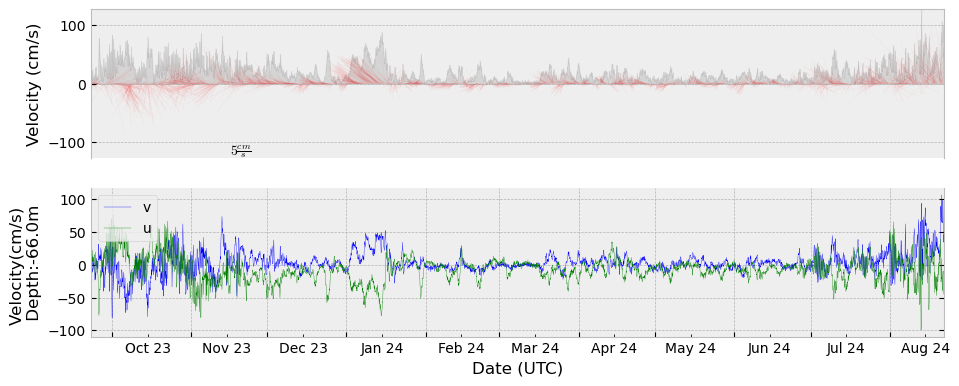

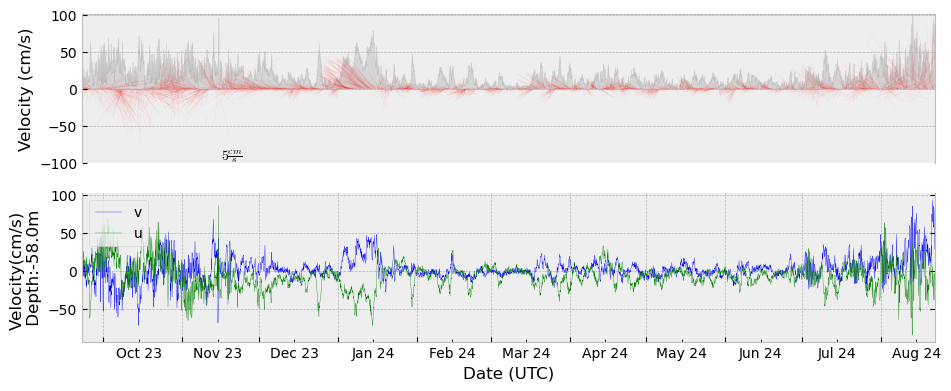

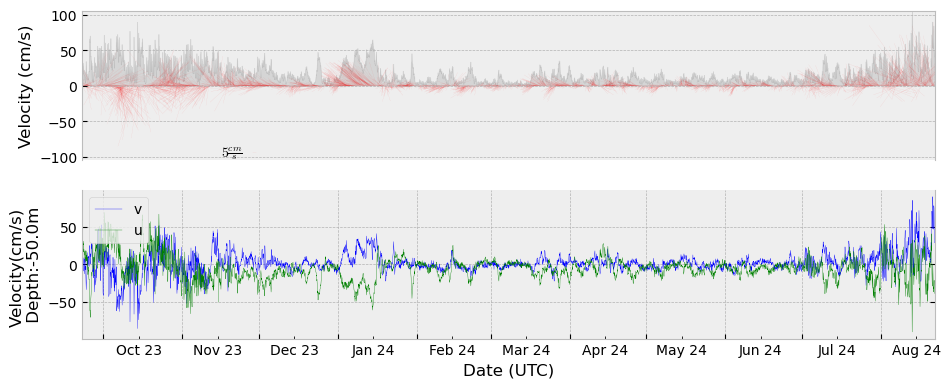

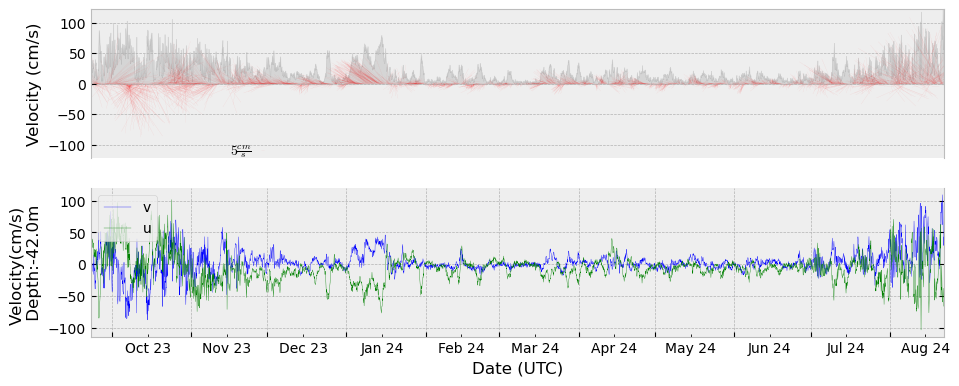

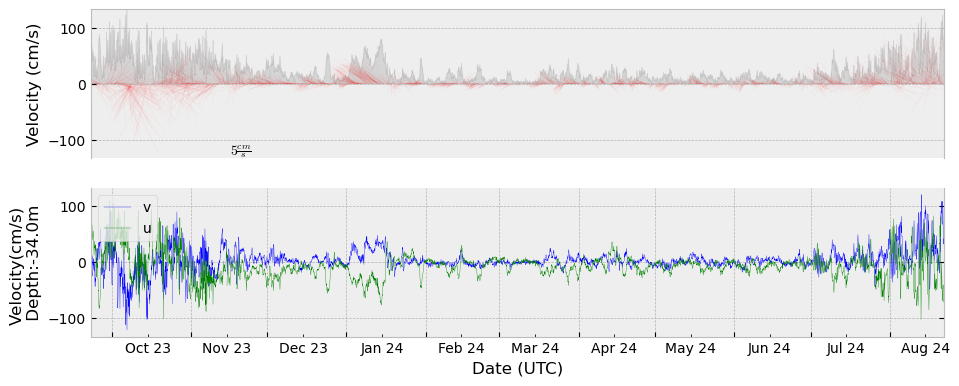

...

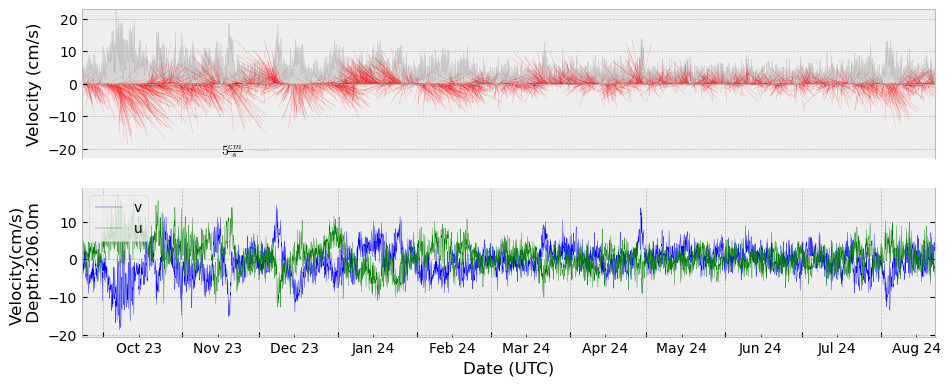

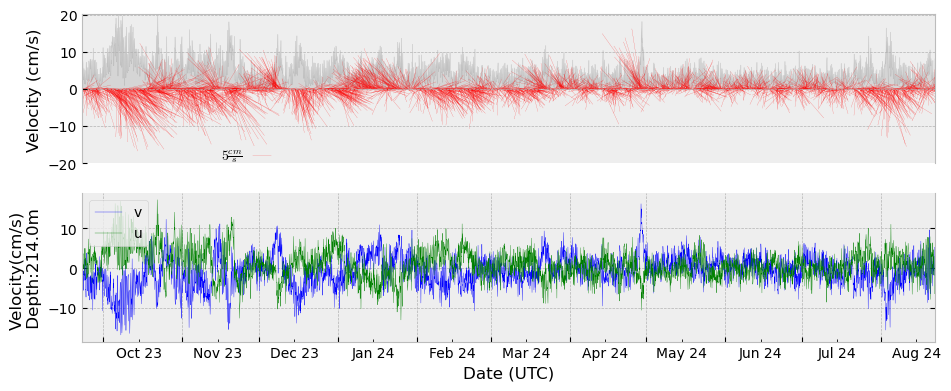

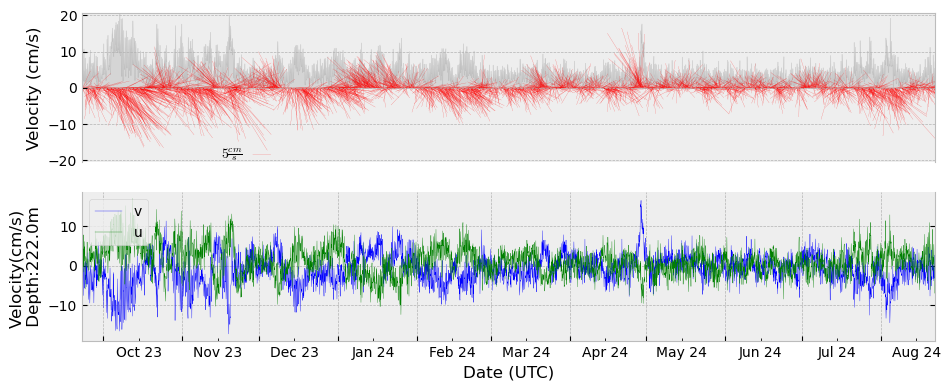

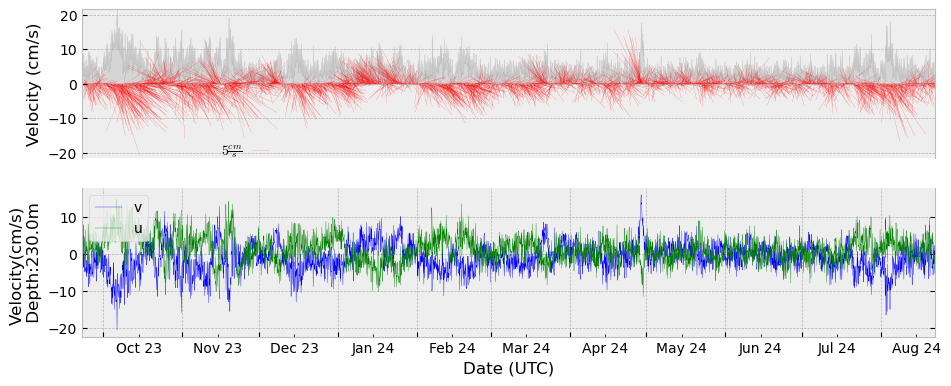

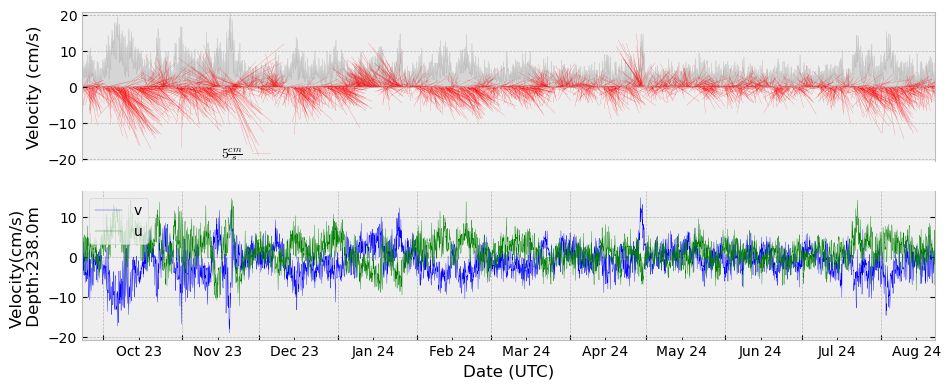

In [10]:
for i in range(0,len(xdf.depth),1):
    rotate_angle = 0
    try:
        p1 = TimeSeriesStickPlot.Timeseries1dStickPlot()
        plt1, fig1 = p1.plot(timedata=xdf.time, 
                         udata=xdf.isel(depth=i,latitude=0,longitude=0).u_curr_comp, 
                         vdata=xdf.isel(depth=i,latitude=0,longitude=0).v_curr_comp,
                         rotate=rotate_angle,
                         ylabel = f'Velocity(cm/s) \n {xdf.isel(depth=i).depth.values}m ')
        plt1.ylabel(f'Velocity(cm/s) \n Depth:{xdf.isel(depth=i).depth.values}m ')

        fig1.savefig(f'images/currents_r{rotate_angle}.{xdf.isel(depth=i).depth.values}m.png')
    except:
        pass

In [7]:
xdf =xdf.where(np.abs(xdf.u_curr_comp) <=750,np.nan)
xdf

<xarray.Dataset>
Dimensions:          (latitude: 1, longitude: 1, time: 4013, depth: 39)
Coordinates:
  * time             (time) datetime64[ns] 2023-09-22T20:00:00 ... 2024-08-22...
  * depth            (depth) float64 -66.0 -58.0 -50.0 ... 222.0 230.0 238.0
  * latitude         (latitude) float64 72.47
  * longitude        (longitude) float64 -156.6
Data variables:
    u_curr_comp      (latitude, longitude, time, depth) float64 -0.3813 ... -...
    v_curr_comp      (latitude, longitude, time, depth) float64 -5.121 ... -0...
    w_curr_comp      (latitude, longitude, time, depth) float64 0.4 4.8 ... -6.4
    w_curr_comp_err  (latitude, longitude, time, depth) float64 -0.9 ... -3.2
    agc1             (latitude, longitude, time, depth) float64 108.0 ... 126.0
    agc2             (latitude, longitude, time, depth) float64 108.0 ... 129.0
    agc3             (latitude, longitude, time, depth) float64 110.0 ... 130.0
    agc4             (latitude, longitude, time, depth) float64 117.0 ... 126.0
Attributes: (12/13)
    Latitude_DegMMddW:                      72 28.201 N
    Longitude_DegMMddN:                     156 34.203 W
    MooringID:                              23CKP-9A
    platform_deployment_date:               2023-09-22T18:32:00Z
    platform_deployment_cruise_name:        SKQ202312S
    platform_recovery_date:                 2024-08-22T05:40:00Z
    ...                                     ...
    platform_deployment_recovery_comments:  Note depths adjusted this year fr...
    WaterDepth:                             920.0
    date_created:                           2025-02-18T08:21:15Z
    date_modified:                          
    QC_indicator:                           unknown
    history:                                Trimmed to deployment.

In [7]:
# xdf['history'] = xdf.history + 'QC of high u/v values'

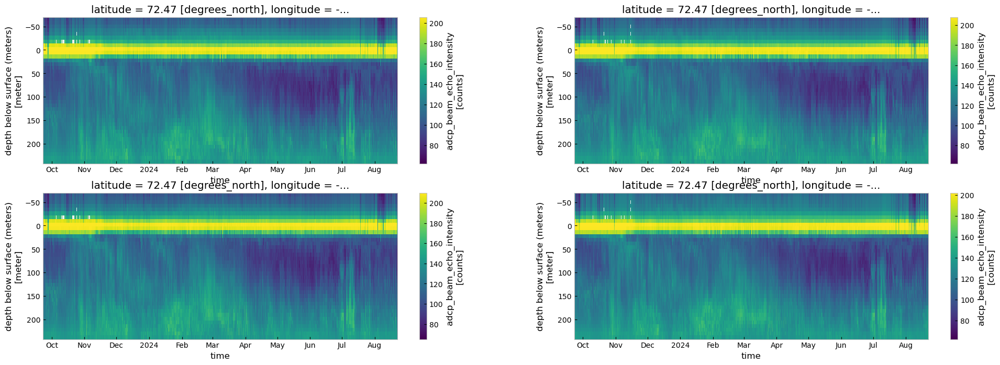

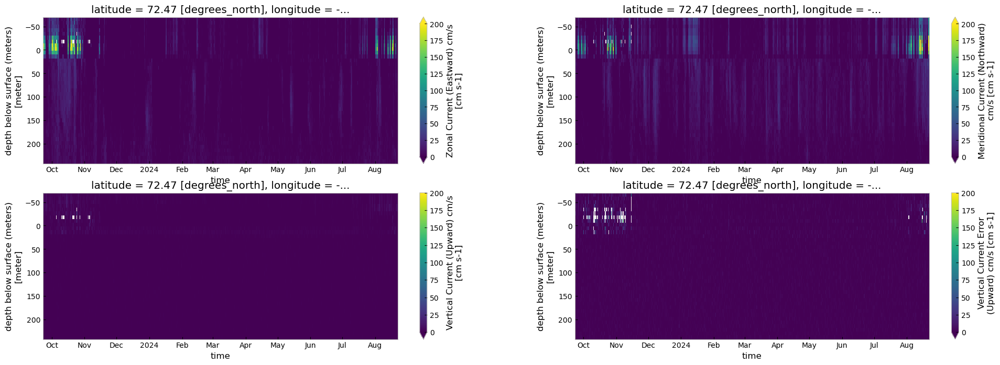

In [14]:
#optional plotting

fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(24,8))
try:
    xdf['agc1'].T.plot(ax=axes[0,0], yincrease=False)
    xdf['agc2'].T.plot(ax=axes[0,1], yincrease=False)
    xdf['agc3'].T.plot(ax=axes[1,0], yincrease=False)
    xdf['agc4'].T.plot(ax=axes[1,1], yincrease=False)
except:
    pass

fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(24,8))
try:
    xdf['u_curr_comp'].T.plot(ax=axes[0,0],vmin=0, vmax=200, yincrease=False)
    xdf['v_curr_comp'].T.plot(ax=axes[0,1],vmin=0, vmax=200, yincrease=False)
    xdf['w_curr_comp'].T.plot(ax=axes[1,0],vmin=0, vmax=200, yincrease=False)
    xdf['w_curr_comp_err'].T.plot(ax=axes[1,1],vmin=0, vmax=200, yincrease=False)
except:
    pass

In [15]:
try:
    xdf.attrs['history'] = xdf.attrs['history']+'  removed U,V >750cm/s'
except:
    xdf.attrs['history'] = '  removed U,V >750cm/s'    

## Trim above surface (negative values)

In [16]:
ixdf = xdf.where(xdf.depth >=-0.).dropna(how='all',dim='depth')

In [17]:
ixdf.attrs['history'] = ixdf.attrs['history']+'  trimmed above surface'

In [18]:
ixdf.to_netcdf('23ckp9a_0254m.trimmed.nc')

In [19]:
xdf = xa.load_dataset('23ckp9a_0254m.trimmed.nc')

In [20]:
ixdf = xdf.interpolate_na(dim='time',max_gap='2h')

In [21]:
ixdf.attrs['history'] = ixdf.attrs['history']+'  linearly interpolated 1hour gaps'

In [22]:
ixdf = ixdf.interpolate_na(dim='depth',max_gap=3)

In [23]:
ixdf.attrs['history'] = ixdf.attrs['history']+'  linearly interpolated 2 vertical bin'

## Interpolate over singleton missing gaps linearly

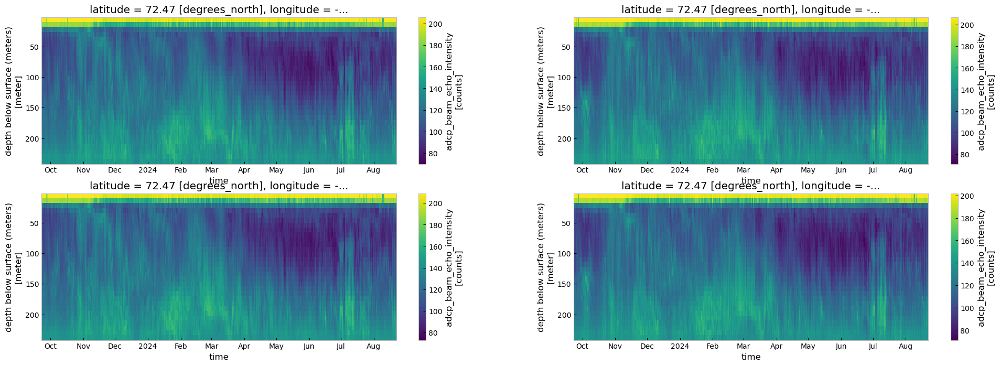

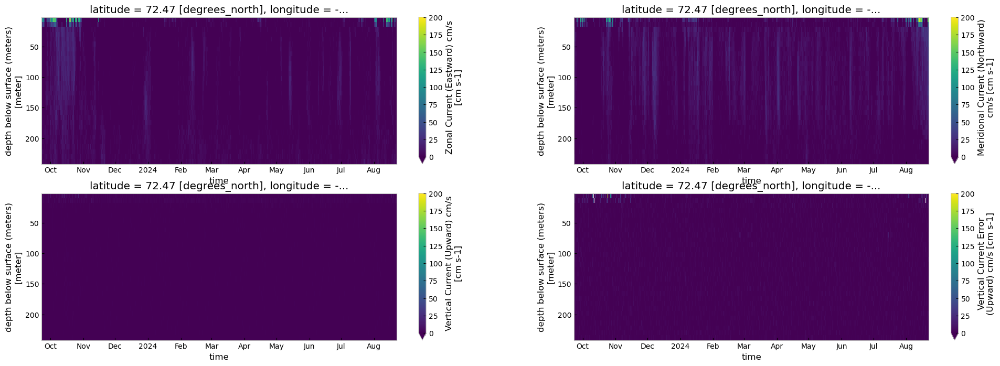

In [24]:

fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(24,8))
try:
    ixdf['agc1'].T.plot(ax=axes[0,0], yincrease=False)
    ixdf['agc2'].T.plot(ax=axes[0,1], yincrease=False)
    ixdf['agc3'].T.plot(ax=axes[1,0], yincrease=False)
    ixdf['agc4'].T.plot(ax=axes[1,1], yincrease=False)
except:
    pass

fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(24,8))
try:
    ixdf['u_curr_comp'].T.plot(ax=axes[0,0],vmin=0, vmax=200, yincrease=False)
    ixdf['v_curr_comp'].T.plot(ax=axes[0,1],vmin=0, vmax=200, yincrease=False)
    ixdf['w_curr_comp'].T.plot(ax=axes[1,0],vmin=0, vmax=200, yincrease=False)
    ixdf['w_curr_comp_err'].T.plot(ax=axes[1,1],vmin=0, vmax=200, yincrease=False)
except:
    pass

In [26]:
ixdf.to_netcdf('23ckp9a_0254m.filtered.nc')